<a href="https://colab.research.google.com/github/ODZ-UJF-AV-CR/SPACEDOS-ISS-RadLab/blob/main/map_SPACEDOS2023.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [3]:
import gdown
import pandas as pd

import matplotlib.pyplot as plt
import matplotlib.dates as mdates


In [16]:
# Google Drive file ID for SPACEDOS_ISS2020_corrected.csv
file_id = "18XZ1PZuYyLiQYr5Xk7S_57Z5i1eCuYib"
url = f"https://drive.google.com/uc?id={file_id}"

# Pracovní kopie CSV
output = "spacedos_working_copy.csv"

# Stažení
gdown.download(url, output, quiet=False)

print("Soubor stažen jako:", output)

Downloading...
From (original): https://drive.google.com/uc?id=18XZ1PZuYyLiQYr5Xk7S_57Z5i1eCuYib
From (redirected): https://drive.google.com/uc?id=18XZ1PZuYyLiQYr5Xk7S_57Z5i1eCuYib&confirm=t&uuid=7148dc3d-f31a-44a0-b958-bb2549490a56
To: /content/spacedos_working_copy.csv
100%|██████████| 231M/231M [00:03<00:00, 75.5MB/s]


Soubor stažen jako: spacedos_working_copy.csv


In [17]:
# Načtení
spacedos = pd.read_csv("spacedos_working_copy.csv", usecols=["corr_time", "ddsi","flux"])

spacedos = spacedos.dropna(subset=["corr_time"])
spacedos["corr_time"] = pd.to_datetime(spacedos["corr_time"], errors="coerce")
spacedos = spacedos.dropna(subset=["corr_time"])

# Seřazení podle času
spacedos = spacedos.sort_values("corr_time")

# Nastavit čas jako index
spacedos = spacedos.set_index("corr_time", drop=False)


spacedos.head()


ValueError: Usecols do not match columns, columns expected but not found: ['corr_time', 'ddsi', 'flux']

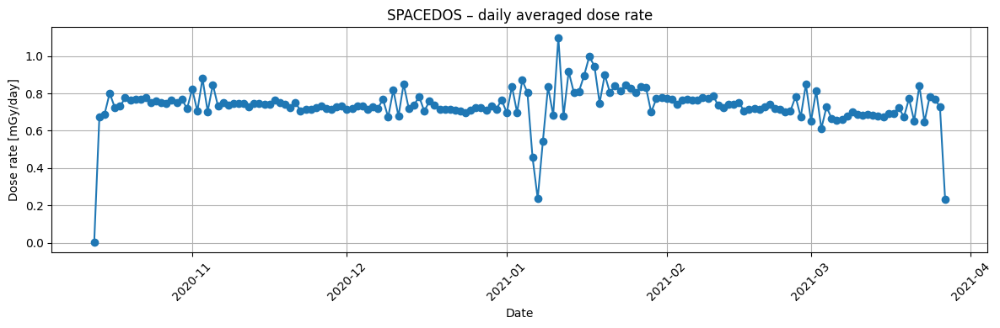

In [6]:
# Převzorkování: průměr ddsi za den → přepočet na mGy/day
daily = spacedos["ddsi"].resample("1D").mean() * 24 * 1e-3
daily.name = "DoseRate_mGy_per_day"

# --- vykreslení ---
plt.figure(figsize=(12,4))
plt.plot(daily.index, daily.values, marker="o")

plt.ylabel("Dose rate [mGy/day]")
plt.xlabel("Date")
plt.title("SPACEDOS – daily averaged dose rate")
plt.grid(True)
plt.xticks(rotation=45)
plt.tight_layout()
plt.show()


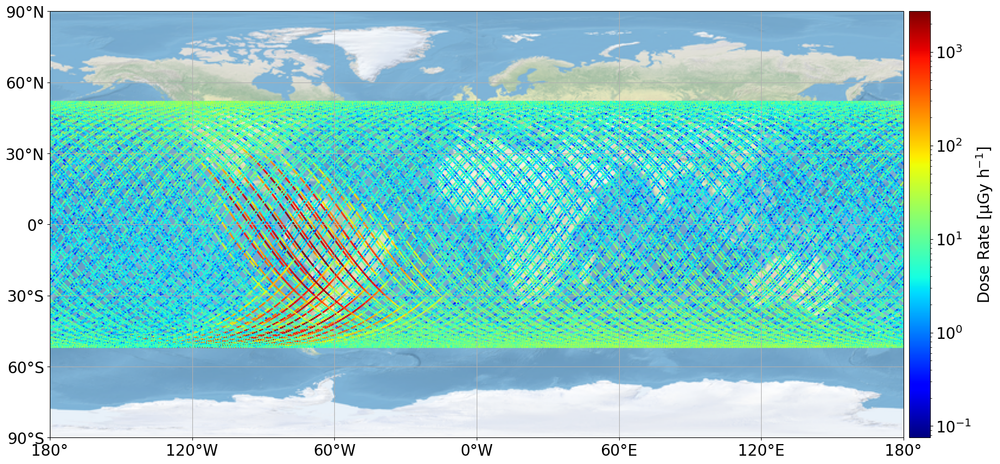

In [7]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
from skyfield.api import load, EarthSatellite
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

# ------------------------------------------------------------
# 1) Časový interval
# ------------------------------------------------------------
t0 = pd.Timestamp("2020-10-14 08:48:47", tz="UTC")
t0 = pd.Timestamp("2020-10-20 00:00:00", tz="UTC")
t1 = pd.Timestamp("2020-10-30 00:00:00", tz="UTC")

# Oříznutí dat na požadovaný interval
rc = spacedos.loc[t0:t1].copy()

# ------------------------------------------------------------
# 2) Načtení TLE
# ------------------------------------------------------------
TLE = """ISS (ZARYA)
1 25544U 98067A   19268.97576939  .00000347  00000-0  14092-4 0  9995
2 25544  51.6418 221.4194 0007471  85.4554  23.2885 15.50107914190898
"""
name, L1, L2 = TLE.splitlines()
sat = EarthSatellite(L1, L2)

ts = load.timescale(builtin=True)
times = ts.utc(rc.index)  # ← přímo použij čas z indexu

# ------------------------------------------------------------
# 3) Výpočet subpointů na Zemi
# ------------------------------------------------------------
geocentric = sat.at(times)
subsat = geocentric.subpoint()

lons = subsat.longitude.degrees
lats = subsat.latitude.degrees

# ------------------------------------------------------------
# 4) Vykreslení mapy
# ------------------------------------------------------------
fig = plt.figure(figsize=(26, 10))
matplotlib.rcParams.update({'font.size': 20})

ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.gridlines(draw_labels=False)

ax.set_xticks([-180, -120, -60, 0, 60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([-90, -60, -30, 0, 30, 60, 90], crs=ccrs.PlateCarree())

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.stock_img()

# Scatter podle dávkového příkonu (µGy/h)
sc = plt.scatter(
    lons, lats,
    s=6, lw=0,
    cmap='jet',
    c=rc['ddsi'],                  # ← dávkový příkon µGy/h
    norm=matplotlib.colors.LogNorm()
)

cb = plt.colorbar(sc, fraction=0.024, pad=0.005)
cb.set_label(r'Dose Rate [µGy h$^{-1}$]')

plt.show()


In [8]:
# Stazeni TLE #########################


import requests
import pandas as pd

# ------------------------------------------------------------
# Space-Track přihlášení
# ------------------------------------------------------------
USERNAME = "TVŮJ_UŽIVATEL"
PASSWORD = "TVÉ_HESLO"
USERNAME = "martin.kakona@odz.ujf.cas.cz"
PASSWORD = "aaaaaaaa12341234"

LOGIN_URL = "https://www.space-track.org/ajaxauth/login"
QUERY_URL = (
    "https://www.space-track.org/basicspacedata/query/class/gp_history/"
    "NORAD_CAT_ID/25544/"
    "EPOCH/%3E2020-09-01/"
    "EPOCH/%3C2021-03-01/"
    "orderby/EPOCH%20asc/format/tle"
)

# ------------------------------------------------------------
# Přihlášení
# ------------------------------------------------------------
session = requests.Session()
login_payload = {"identity": 'martin.kakona@odz.ujf.cas.cz', "password": 'aaaaaaaa12341234'}

print("➡️  Přihlašuji se na Space-Track…")
resp = session.post(LOGIN_URL, data=login_payload)

if resp.status_code != 200:
    raise RuntimeError("❌ Nelze se přihlásit na Space-Track.")

# ------------------------------------------------------------
# Stažení TLE
# ------------------------------------------------------------
print("➡️  Stahuji TLE data…")
resp = session.get(QUERY_URL)

if resp.status_code != 200:
    raise RuntimeError("❌ Chyba při stahování TLE.")

tle_text = resp.text
print(f"✔️  Staženo {len(tle_text.splitlines())//3} TLE záznamů.")

# ------------------------------------------------------------
# Uložení do souboru
# ------------------------------------------------------------
output_file = "iss_tle_2020_2021.tle"
with open(output_file, "w") as f:
    f.write(tle_text)

print(f"✔️  Uloženo do {output_file}")



➡️  Přihlašuji se na Space-Track…
➡️  Stahuji TLE data…
✔️  Staženo 28095 TLE záznamů.
✔️  Uloženo do iss_tle_2020_2021.tle


In [9]:
# Skript, který načte a vypíše prvních 3 TLE trojic ze souboru iss_tle_2019_2020.tle

fname = "iss_tle_2020_2021.tle"

with open(fname, "r") as f:
    lines = [ln.rstrip("\n") for ln in f if ln.strip()]

print("Počet načtených řádků:", len(lines))
print("====================================\n")

# vezmeme první 3 trojice (jméno + řádek 1 + řádek 2)
max_tle = 3
for i in range(0, min(len(lines), max_tle * 3), 3):
    name = lines[i]
    L1 = lines[i + 1]
    L2 = lines[i + 2]

    print(f"TLE #{i//3 + 1}")
    print("name:", repr(name))
    print("L1  :", repr(L1))
    print("L2  :", repr(L2))
    print("------------------------------------")


Počet načtených řádků: 84286

TLE #1
name: '1 25544U 98067A   98324.28472222 -.00003657  11563-4  00000+0 0  9996'
L1  : '2 25544 051.5908 168.3788 0125362 086.4185 359.7454 16.05064833    05'
L2  : '1 25544U 98067A   98324.33235038  .11839616  11568-4  57349-2 0  9993'
------------------------------------
TLE #2
name: '2 25544 051.6173 168.1099 0123410 088.0187 273.4932 16.04971811    11'
L1  : '1 25544U 98067A   98324.45674522 -.00043259  11566-4 -18040-4 0  9996'
L2  : '2 25544 051.5914 167.4317 0125858 091.3429 269.4598 16.05134416    30'
------------------------------------
TLE #3
name: '1 25544U 98067A   98324.51913017  .00713053  11562-4  34316-3 0  9991'
L1  : '2 25544 051.5959 167.1152 0123861 087.8179 273.5890 16.05002967    44'
L2  : '1 25544U 98067A   98324.58140904  .00632617  11564-4  30202-3 0  9993'
------------------------------------


In [10]:
# 1) zahodíme původní index
spacedos = spacedos.reset_index(drop=True)

# 2) vytvoříme nový čas posunutý o +1000 s
spacedos["time_shifted"] = spacedos["corr_time"] + pd.to_timedelta(80, "s")

# 3) nastavíme nový index
spacedos = spacedos.set_index("time_shifted")
spacedos.index.name = "time"


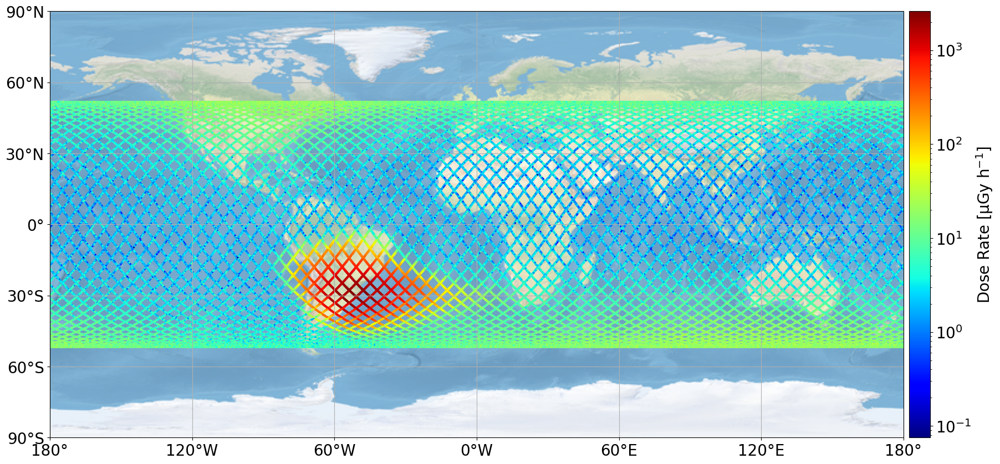

In [11]:
import pandas as pd
import matplotlib
import matplotlib.pyplot as plt
import matplotlib.colors as colors
from skyfield.api import load, EarthSatellite
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter
from datetime import datetime, timedelta
import pytz


# ============================================================
#  FUNKCE: načtení ISS TLE archivního souboru (formát 1/2 řádek)
# ============================================================
def load_tle_dataframe(fname):
    with open(fname, "r") as f:
        lines = f.read().splitlines()

    rows = []
    i = 0
    while i < len(lines) - 1:
        L1 = lines[i]
        L2 = lines[i + 1]

        # chceme jen páry začínající "1 " a "2 "
        if not (L1.startswith("1 ") and L2.startswith("2 ")):
            i += 1
            continue

        # epoch ve sloupcích 19–32 (0-based 18:32)
        epoch_raw = L1[18:32].strip()   # YYDDD.dddddd
        yy = int(epoch_raw[:2])
        ddd_frac = float(epoch_raw[2:])

        year = 2000 + yy if yy < 57 else 1900 + yy
        day = int(ddd_frac)
        frac = ddd_frac - day

        base = datetime(year, 1, 1, tzinfo=pytz.UTC) + timedelta(days=day - 1)
        epoch = base + timedelta(days=frac)

        rows.append({
            "L1": L1,
            "L2": L2,
            "epoch": pd.Timestamp(epoch)
        })

        i += 2

    df = pd.DataFrame(rows).set_index("epoch").sort_index()
    return df


# ============================================================
# 1) Časový interval SPACEDOS dat
# ============================================================
#t0 = pd.Timestamp("2019-09-25 19:42:40", tz="UTC")
t0 = pd.Timestamp("2020-11-15 00:00:00", tz="UTC")
t1 = pd.Timestamp("2020-12-30 00:00:00", tz="UTC")

rc = spacedos.loc[t0:t1].copy()
rc = rc.sort_index()  # jistota


# ============================================================
# 2) Načtení TLE archivu + odstranění duplicit (nutné pro merge_asof)
# ============================================================
tle = load_tle_dataframe("iss_tle_2020_2021.tle")
tle = tle[~tle.index.duplicated(keep="last")]


# ============================================================
# 3) Přiřazení správného TLE každému času SPACEDOS
#    pomocí merge_asof (funguje pro celé pole časů)
# ============================================================
rc.index.name = "time_index"
rc_reset = rc.reset_index().rename(columns={"time_index": "time"})

tle_reset = tle.reset_index().rename(columns={"epoch": "time"})

rc_merged = pd.merge_asof(
    rc_reset.sort_values("time"),
    tle_reset.sort_values("time"),
    on="time",
    direction="backward"
)

rc = rc_merged.set_index("time")


# ============================================================
# 4) Výpočet polohy ISS segmentově podle unikátní dvojice L1/L2
# ============================================================
ts = load.timescale(builtin=True)

rc["lon"] = pd.NA
rc["lat"] = pd.NA

for (L1, L2), segment in rc.groupby(["L1", "L2"]):
    sat = EarthSatellite(L1, L2)
    times = ts.utc(segment.index)

    geoc = sat.at(times)
    subsat = geoc.subpoint()

    rc.loc[segment.index, "lon"] = subsat.longitude.degrees
    rc.loc[segment.index, "lat"] = subsat.latitude.degrees


# vynecháme případy, kde se nepodařilo spočítat
rc = rc.dropna(subset=["lon", "lat"])


# ============================================================
# 5) Vykreslení mapy
# ============================================================
fig = plt.figure(figsize=(26, 10))
matplotlib.rcParams.update({'font.size': 20})

ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.gridlines(draw_labels=False)

ax.set_xticks([-180, -120, -60,  0,  60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([-90,  -60, -30,   0,  30,  60,  90], crs=ccrs.PlateCarree())

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.stock_img()

sc = plt.scatter(
    rc["lon"],
    rc["lat"],
    s=5,
    lw=0,
    cmap="jet",
    c=rc["ddsi"],    # dávkový příkon v µGy/h
    norm=colors.LogNorm()
)

cb = plt.colorbar(sc, fraction=0.024, pad=0.005)
cb.set_label(r"Dose Rate [µGy h$^{-1}$]")

plt.show()


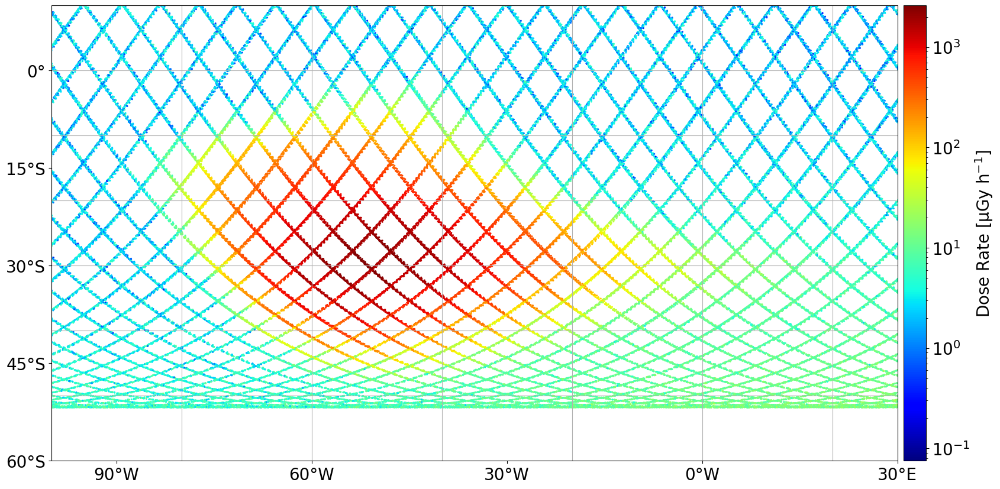

In [12]:
# ============================================================
# 5) Vykreslení mapy – výřez
# ============================================================

import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as colors
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

fig = plt.figure(figsize=(26, 10))
matplotlib.rcParams.update({'font.size': 20})

# projekce
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# výřez: [west, east, south, north]
ax.set_extent([-100, 30, -60, 10], crs=ccrs.PlateCarree())

# mřížka (bez popisků)
ax.gridlines(draw_labels=False)

# ruční výběr ticků
ax.set_xticks([-90, -60, -30, 0, 30], crs=ccrs.PlateCarree())
ax.set_yticks([-60, -45, -30, -15, 0], crs=ccrs.PlateCarree())

# formátování zeměpisných souřadnic
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

# podkladová mapa
#ax.stock_img()

# scatter ISS polohy podle dávkového příkonu
sc = plt.scatter(
    rc["lon"],
    rc["lat"],
    s=5,
    lw=0,
    cmap="jet",
    c=rc["ddsi"],                  # dávkový příkon v µGy/h
    norm=colors.LogNorm()
)

# barevná škála
cb = plt.colorbar(sc, fraction=0.024, pad=0.005)
cb.set_label(r"Dose Rate [µGy h$^{-1}$]")

plt.show()


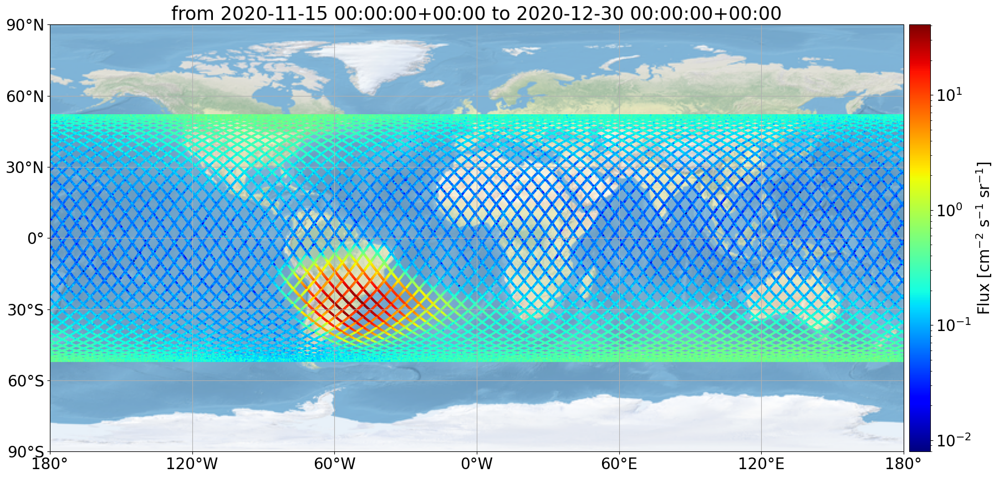

In [13]:
# ============================================================
# 5) Vykreslení mapy (flux místo ddsi)
# ============================================================
fig = plt.figure(figsize=(26, 10))
matplotlib.rcParams.update({'font.size': 20})

ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())
ax.gridlines(draw_labels=False)

ax.set_xticks([-180, -120, -60,  0,  60, 120, 180], crs=ccrs.PlateCarree())
ax.set_yticks([-90,  -60, -30,   0,  30,  60,  90], crs=ccrs.PlateCarree())

ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

ax.stock_img()

# Scatter podle FLUXU  [cm^-2 s^-1 sr^-1]
sc = plt.scatter(
    rc["lon"],
    rc["lat"],
    s=5,
    lw=0,
    cmap="jet",
    c=rc["flux"],                 # ← ZMĚNA: flux místo ddsi
    norm=colors.LogNorm()
)

cb = plt.colorbar(sc, fraction=0.024, pad=0.005)
cb.set_label(r'Flux [cm$^{-2}$ s$^{-1}$ sr$^{-1}$]')   # ← ZMĚNA

ax.set_title('from '+str(t0)+' to '+str(t1))
plt.show()


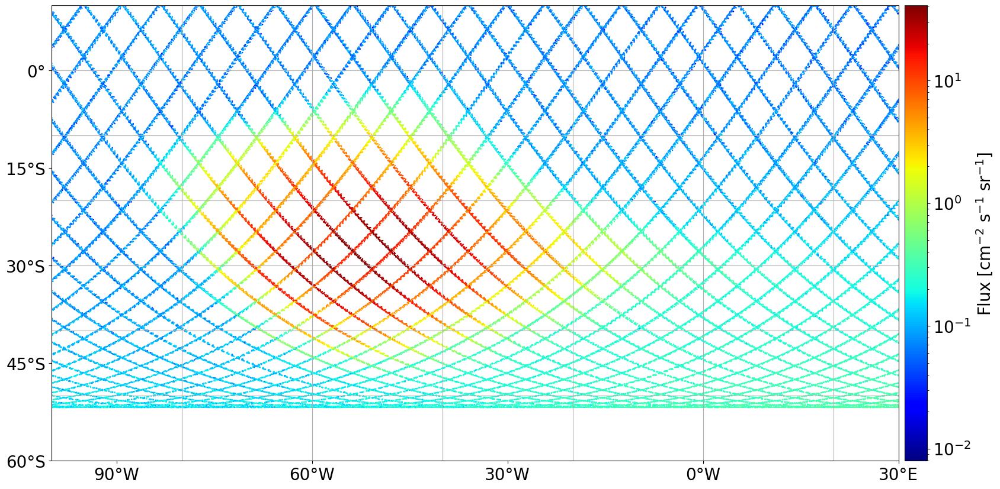

In [14]:
# ============================================================
# 5) Vykreslení mapy – výřez
# ============================================================

import matplotlib.pyplot as plt
import matplotlib
import matplotlib.colors as colors
import cartopy.crs as ccrs
from cartopy.mpl.ticker import LongitudeFormatter, LatitudeFormatter

fig = plt.figure(figsize=(26, 10))
matplotlib.rcParams.update({'font.size': 20})

# projekce
ax = fig.add_subplot(1, 1, 1, projection=ccrs.PlateCarree())

# výřez: [west, east, south, north]
ax.set_extent([-100, 30, -60, 10], crs=ccrs.PlateCarree())

# mřížka (bez popisků)
ax.gridlines(draw_labels=False)

# ruční výběr ticků
ax.set_xticks([-90, -60, -30, 0, 30], crs=ccrs.PlateCarree())
ax.set_yticks([-60, -45, -30, -15, 0], crs=ccrs.PlateCarree())

# formátování zeměpisných souřadnic
ax.xaxis.set_major_formatter(LongitudeFormatter(zero_direction_label=True))
ax.yaxis.set_major_formatter(LatitudeFormatter())

# podkladová mapa
#ax.stock_img()

# scatter ISS polohy podle dávkového příkonu
sc = plt.scatter(
    rc["lon"],
    rc["lat"],
    s=3,
    lw=0,
    cmap="jet",
    c=rc["flux"],                  # dávkový příkon v µGy/h
    norm=colors.LogNorm()
)

# barevná škála
cb = plt.colorbar(sc, fraction=0.024, pad=0.005)
cb.set_label(r"Flux [cm$^{-2}$ s$^{-1}$ sr$^{-1}$]")

plt.show()


Počet TLE v období: 229


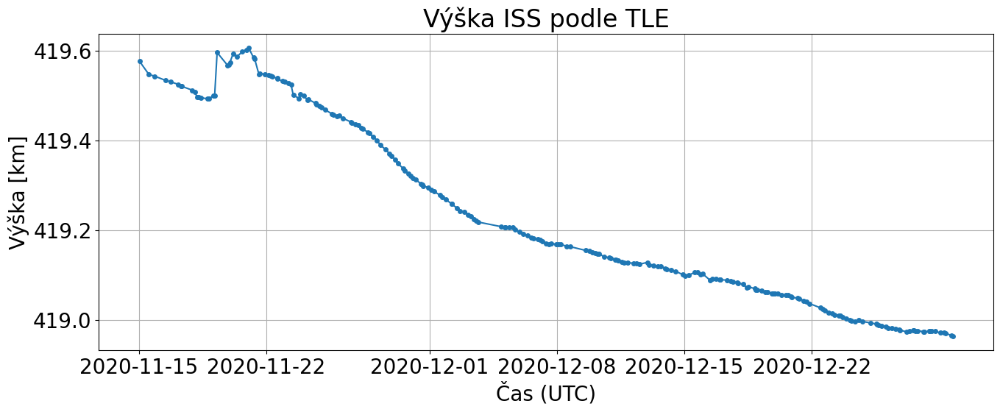

In [15]:
import numpy as np
import matplotlib.pyplot as plt

# ------------------------------------------------------------
# Funkce: výpočet výšky ISS z mean motion
# ------------------------------------------------------------
MU = 3.986004418e14          # gravitační parametr Země [m^3/s^2]
R_EARTH = 6378.137e3         # poloměr Země [m]

def height_from_mean_motion(n_rev_per_day):
    """
    n_rev_per_day – mean motion z TLE [revolutions per day]
    vrací: výška dráhy v metrech
    """

    # mean motion → rad/s
    n = n_rev_per_day * 2 * np.pi / 86400.0

    # poloměr dráhy podle Keplera
    a = (MU / n**2)**(1/3)

    # výška nad povrchem
    h = a - R_EARTH
    return h


# ------------------------------------------------------------
# 1) Vyber TLE pro dané období
# ------------------------------------------------------------
tle_window = tle.loc[(tle.index >= t0) & (tle.index <= t1)].copy()

print("Počet TLE v období:", len(tle_window))

# ------------------------------------------------------------
# 2) Získání mean motion z řádku L2
# ------------------------------------------------------------
# mean motion je ve sloupcích 53–63 (0-based index)
tle_window["mean_motion"] = tle_window["L2"].str.slice(52, 63).astype(float)

# ------------------------------------------------------------
# 3) Výpočet výšky
# ------------------------------------------------------------
tle_window["height_m"] = tle_window["mean_motion"].apply(height_from_mean_motion)
tle_window["height_km"] = tle_window["height_m"] / 1000.0

# ------------------------------------------------------------
# 4) Graf výšky ISS
# ------------------------------------------------------------
plt.figure(figsize=(14, 6))
plt.plot(tle_window.index, tle_window["height_km"], marker="o", ms=4)

plt.title("Výška ISS podle TLE")
plt.xlabel("Čas (UTC)")
plt.ylabel("Výška [km]")

plt.grid(True)
plt.tight_layout()
plt.show()


In [1]:
pip install skyfield


   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 371.1/371.1 kB 7.5 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.6/49.6 kB 1.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 218.1/218.1 kB 10.1 MB/s eta 0:00:00


In [2]:
pip install cartopy

   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 11.8/11.8 MB 53.3 MB/s eta 0:00:00
